### The Goal of this project is to demonstrate the following things:
- Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
- Apply a distortion correction to raw images.
- Use color transforms, gradients, etc., to create a thresholded binary image.
- Apply a perspective transform to rectify binary image ("birds-eye view").
- Detect lane pixels and fit to find the lane boundary.
- Determine the curvature of the lane and vehicle position with respect to center.
- Warp the detected lane boundaries back onto the original image.
- Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

## Camera Calibration

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
objpoints = [] 
imgpoints = []

objp = np.zeros((9*6,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

nx=9
ny=6

img=cv2.imread('calibration2.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
if ret== True:
    imgpoints.append(corners)
    
    objpoints.append(objp)
    
    cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
    plt.imshow(img)

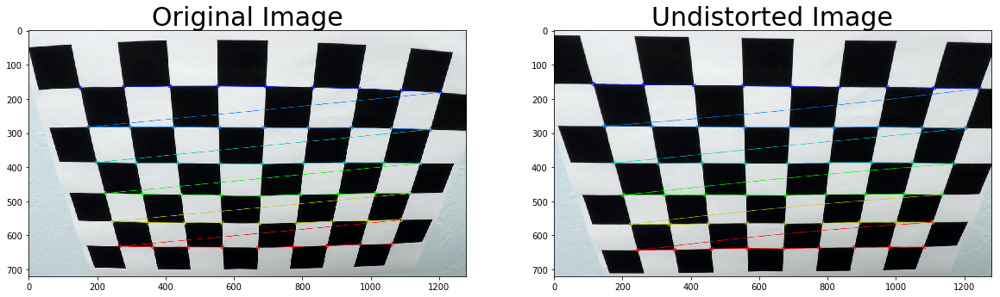

In [2]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

undis_img = cv2.undistort(img, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undis_img)
ax2.set_title('Undistorted Image', fontsize=30)

import pickle
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "Project2_pickle.p", "wb" ) )

### Test the undistortion in more raw images

In [3]:
import glob
images=glob.glob('test_images/*.jpg')

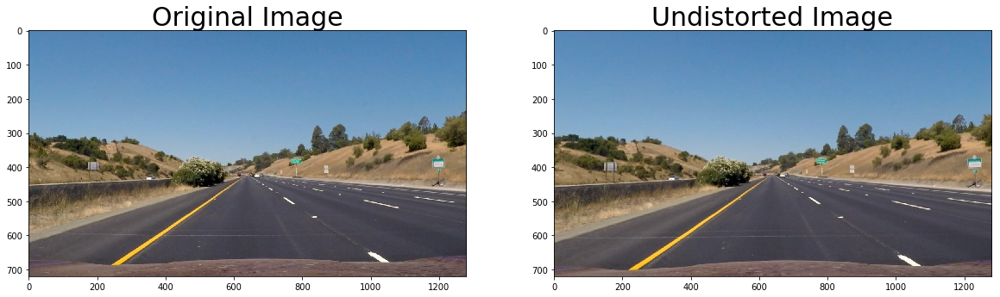

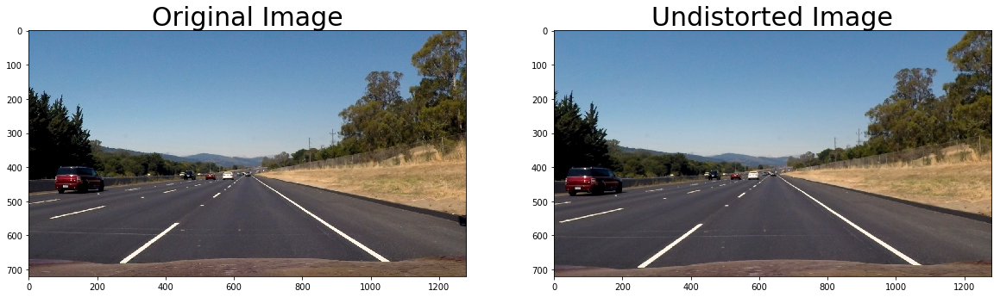

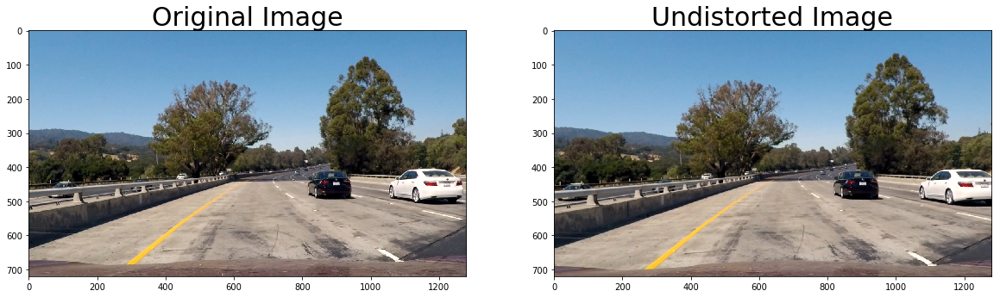

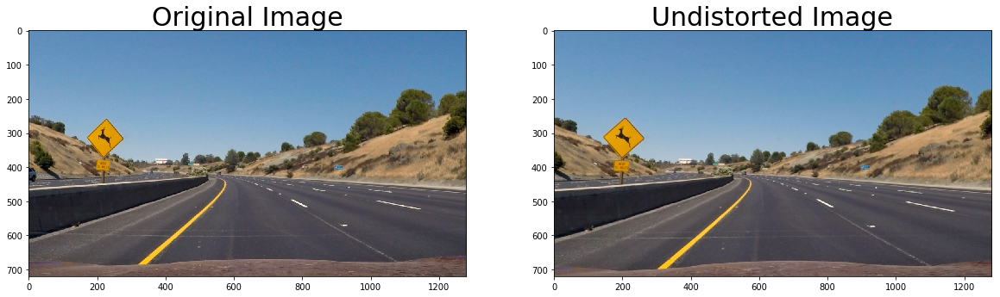

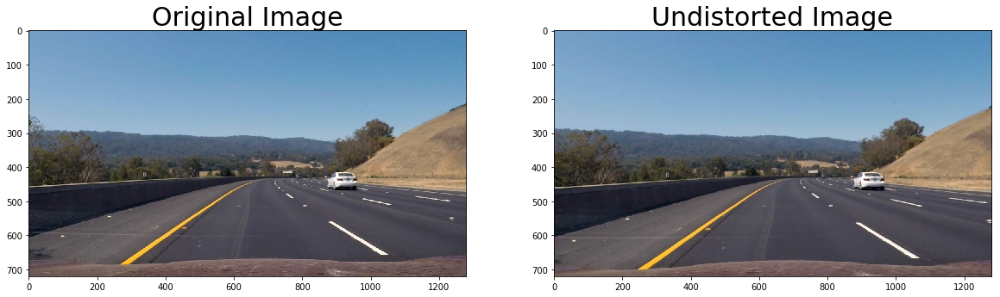

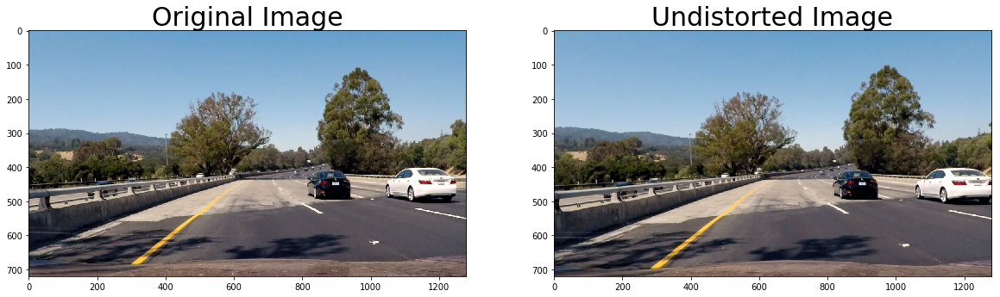

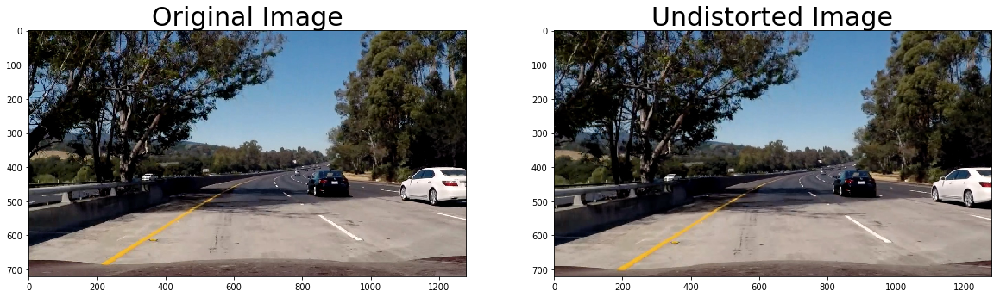

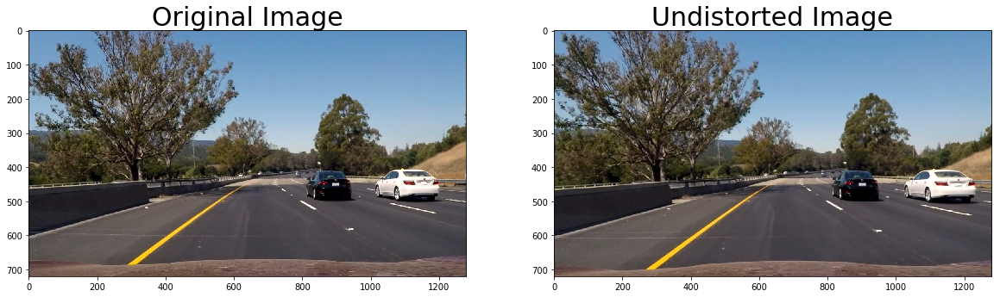

In [4]:
for i in images:
    img=mpimg.imread(i)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    undis_img = cv2.undistort(img, mtx, dist, None, mtx)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(undis_img)
    ax2.set_title('Undistorted Image', fontsize=30)
    plt.savefig('Original_UndistortedImage')     

In [5]:
def abs_sobel_thresh(img, ksize, orient='x', thresh_min=50, thresh_max=100):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize))
        
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize))
        
    scale_factor = np.max(abs_sobel)/255 
    scaled_sobel = (abs_sobel/scale_factor).astype(np.uint8)
    
    grad_binary = np.zeros_like(scaled_sobel)
    
    grad_binary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    return grad_binary

In [6]:
def mag_thresh(img, ksize=3, mag_thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize)
    
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize)
    
    gradmag = np.sqrt(sobelx**2 + sobely**2)    
    
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    

    grad_mag_binary = np.zeros_like(gradmag)
    grad_mag_binary[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    return grad_mag_binary

In [7]:
def dir_grad_thresh(img, ksize=15, thresh=(0, np.pi/2)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize)
    

    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    
    dir_grad_binary =  np.zeros_like(absgraddir)
    dir_grad_binary[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
   
    return dir_grad_binary

In [8]:
def LAB_thresh(img, thresh=(0, 255)):
    lab = cv2.cvtColor(img,cv2.COLOR_RGB2LAB)
    B = lab[:,:,2]
    binary_B = np.zeros_like(B)
    binary_B[(B > thresh[0])&(B <= thresh[1])] = 1

    return binary_B

In [9]:
def hls_select(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    s_binary_output = np.zeros_like(s_channel)
    s_binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1

    return s_binary_output

In [10]:
def color_lines(image):
    img=np.copy(image)
    lower= np.uint8([0,0,200])
    upper=np.uint8([0,0,255])
    red_mask=cv2.inRange(img,lower,upper)
    
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS).astype(np.float)    
    lower = np.uint8([  0, 200,   0])
    upper = np.uint8([255, 255, 255])
    white_mask = cv2.inRange(hls, lower, upper)
    
    lower = np.uint8([ 5,   0, 100])
    upper = np.uint8([ 60, 255, 255])
    yellow_mask = cv2.inRange(hls, lower, upper)
    
    mask = cv2.bitwise_or(white_mask, yellow_mask)
    
    combined_binary = cv2.bitwise_and(image, image, mask = mask)
    
    combined_binary = cv2.cvtColor(combined_binary, cv2.COLOR_RGB2GRAY).astype(np.float)/255

    return combined_binary

In [11]:
def combine_threshold(undis_img):


    x_grad_binary=abs_sobel_thresh(undis_img, ksize, orient='x', thresh_min=50, thresh_max=100)
    y_grad_binary=abs_sobel_thresh(undis_img, ksize, orient='y', thresh_min=50, thresh_max=100)
    grad_mag_binary=mag_thresh(undis_img, ksize=3, mag_thresh=(70, 100))
    dir_grad_binary=dir_grad_thresh(undis_img, ksize=15, thresh=(0.3, 0.9)) #np.pi/2
    s_binary_output=hls_select(undis_img, thresh=(180, 255))
    l_binary = LAB_thresh(undis_img, thresh=(130, 255))

    combined_binary = color_lines(undis_img)
    
    color_combined = np.zeros_like(y_grad_binary)

    
    color_combined[((x_grad_binary == 1) & (y_grad_binary == 1)) | 
                    ((grad_mag_binary == 1) & (dir_grad_binary == 1) | (s_binary_output == 1)) &
                  ((s_binary_output == 1) & (l_binary == 1))|(combined_binary > 0)]=1
    
    return color_combined

In [12]:
def warp(img):
    img_size = (img.shape[1], img.shape[0])

    src = np.float32(
        [[273,680],
         [1046,680],
         [585,455],
         [700,455]])

    dst = np.float32(
        [[300,720],
         [980,720],
         [300,0],
         [980,0]])

    M = cv2.getPerspectiveTransform(src, dst)
    M_inv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, img_size,flags = cv2.INTER_LINEAR)
    return warped, M_inv

In [13]:
def pipelines(image_path):
    img=mpimg.imread(image_path)
    undis_img = cv2.undistort(img, mtx, dist, None, mtx)
    warped_img, M_inv = warp(undis_img)

    color_combined=combine_threshold(warped_img)
    return color_combined, undis_img, M_inv

In [14]:
import pickle
dist_pickle=pickle.load(open('Project2_pickle.p','rb'))
mtx=dist_pickle['mtx']
dist=dist_pickle['dist']

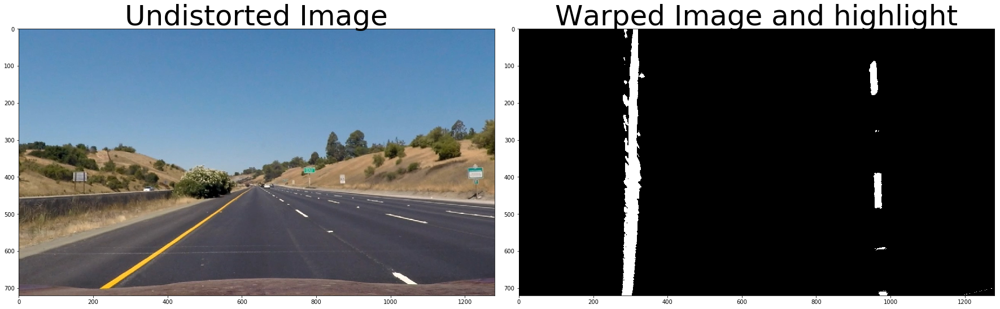

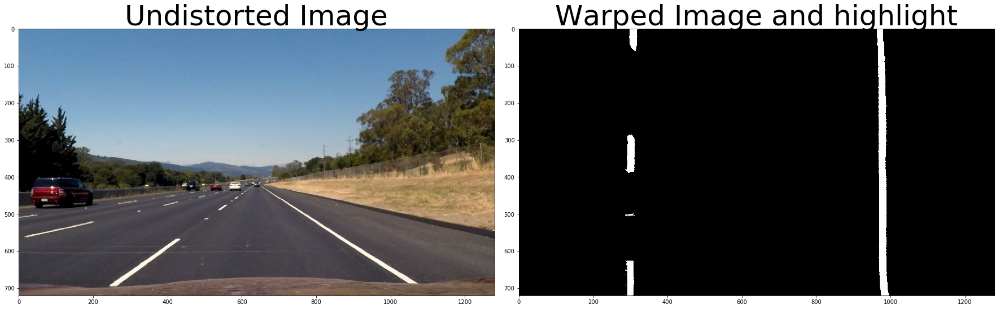

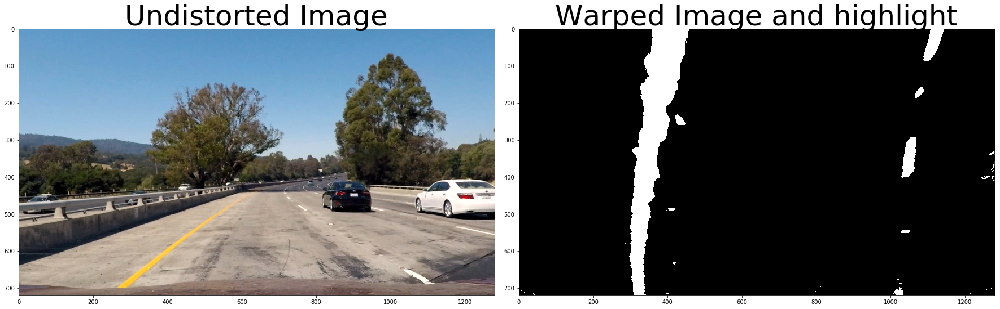

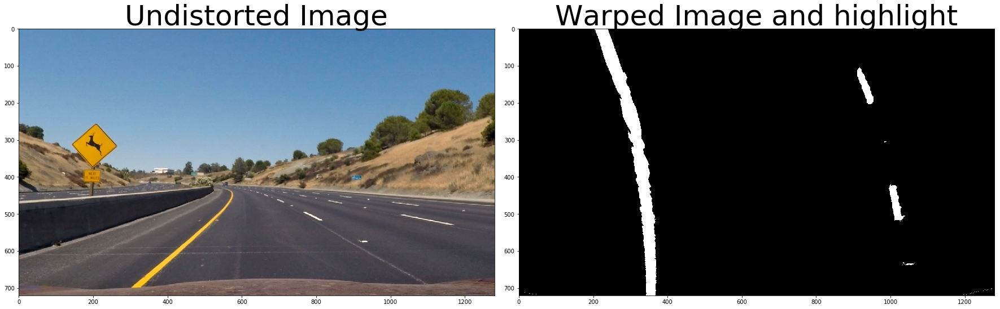

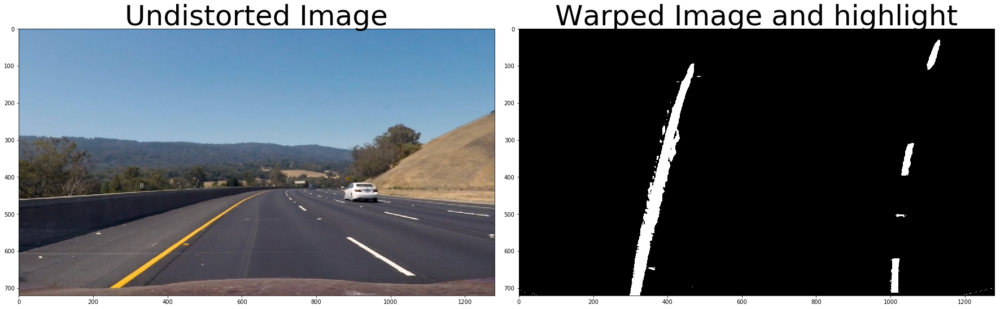

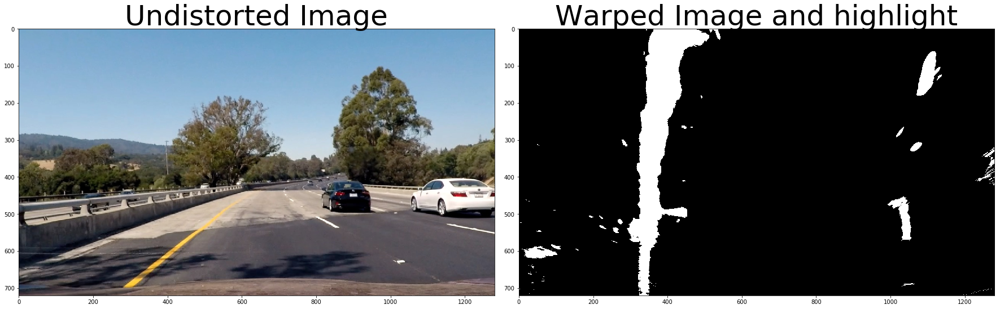

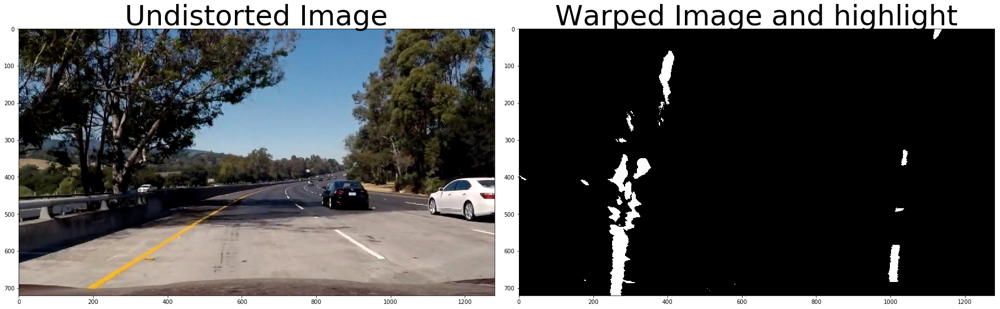

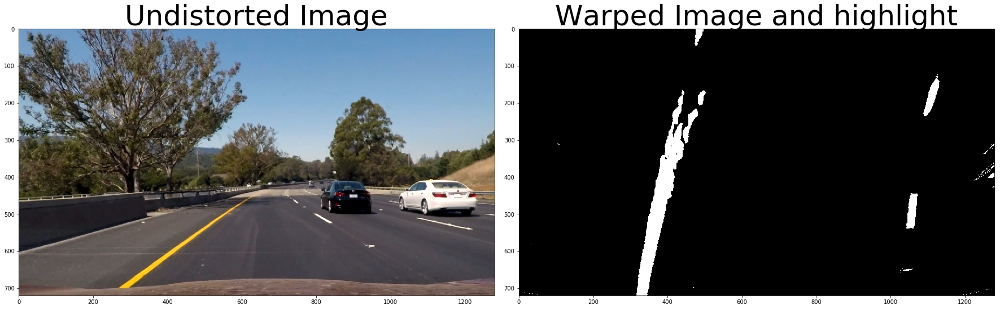

In [15]:
ksize=3
for i in images:
    color_combined, undis_img, M_inv = pipelines(i)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(undis_img)
    ax1.set_title('Undistorted Image', fontsize=50)
    ax2.imshow(color_combined, cmap='gray')
    ax2.set_title('Warped Image and highlight', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()


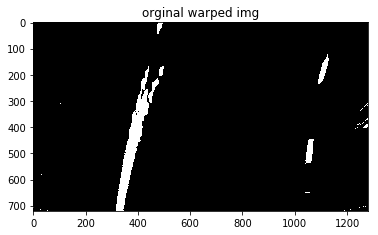

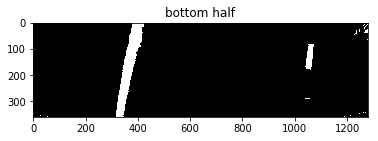

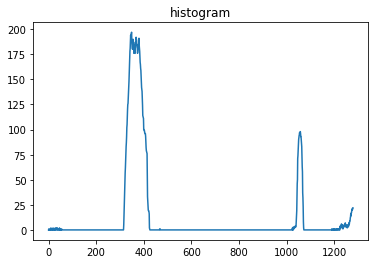

In [16]:
binary_warped=np.copy(color_combined)
plt.figure(1)
plt.title('orginal warped img')
plt.imshow(binary_warped,cmap='gray')


bottom_half = binary_warped[binary_warped.shape[0]//2:,:]

plt.figure(2)
plt.title('bottom half')
plt.imshow(bottom_half,cmap='gray')


histogram = np.sum(bottom_half, axis=0)


plt.figure(3)
plt.title('histogram')
plt.plot(histogram)

In [17]:
def find_lane_pixels(binary_warped):
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))

    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint


    nwindows = 9
    margin = 100
    minpix = 50

    window_height = np.int(binary_warped.shape[0]//nwindows)
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    leftx_current = leftx_base
    rightx_current = rightx_base

    left_lane_inds = []
    right_lane_inds = []

    for window in range(nwindows):
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        pass

    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img        

In [18]:
def fit_polynomial(binary_warped):
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

    return out_img, left_fit, right_fit, left_fitx, right_fitx

In [19]:
def fit_polynomial2(binary_warped):
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty


    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]



    return out_img, left_fit, right_fit, left_fitx, right_fitx

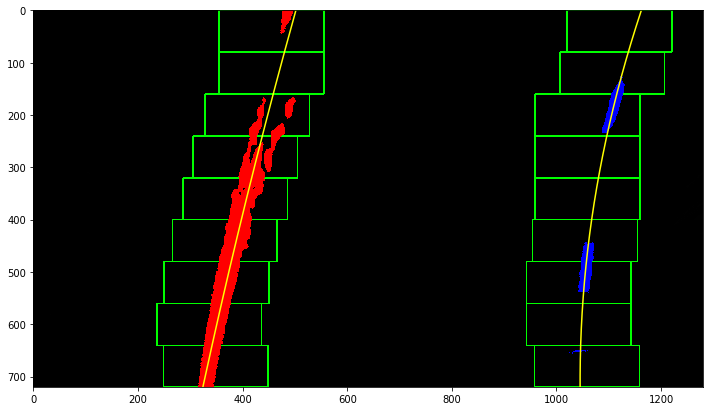

In [35]:
out_img, left_fit, right_fit, left_fitx, right_fitx = fit_polynomial(binary_warped)
from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
plt.imshow(out_img)

In [21]:
def fit_poly(img_shape, leftx, lefty, rightx, righty):

    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

In [22]:
def search_around_poly(binary_warped):
    margin = 100

    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    

    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]


    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    
    return result


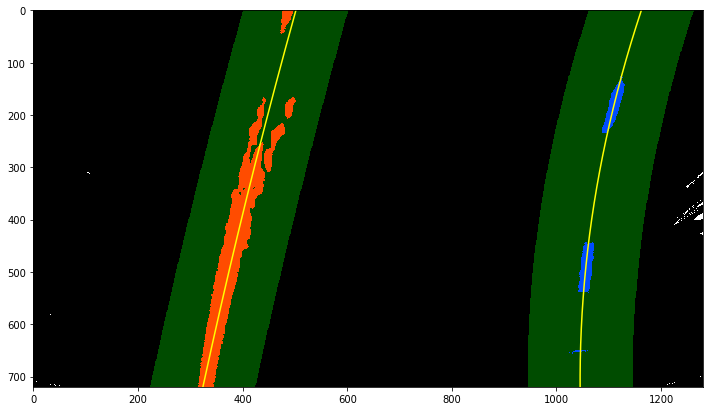

In [23]:
lane_with_boundary = search_around_poly(binary_warped)
plt.imshow(lane_with_boundary)

In [24]:
def project_lane_line(binary_img, left_fit, right_fit,M_inv, undis_img):
    new_img = np.copy(undis_img)
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
        
    ploty = np.linspace(0, binary_img.shape[0]-1, binary_img.shape[0])
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    newwarp = cv2.warpPerspective(color_warp, M_inv, (binary_img.shape[1], binary_img.shape[0])) 
    result = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
    return result

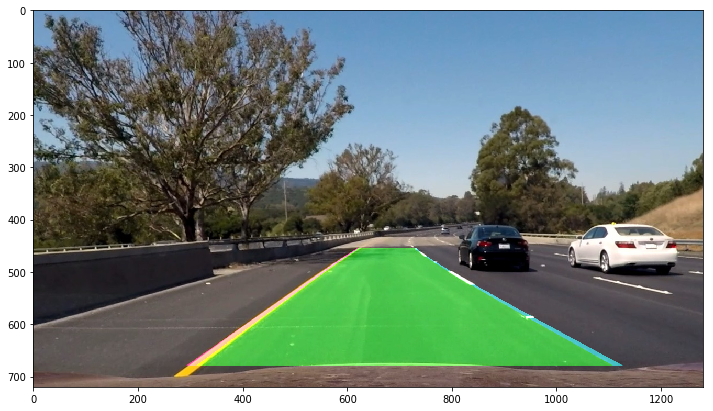

In [25]:
result = project_lane_line(binary_warped,left_fit, right_fit, M_inv, undis_img)
plt.imshow(result)

In [26]:
def measure_curvature(img,left_fitx, right_fitx):
    
    ym_per_pix = 30/720 
    xm_per_pix = 3.7/700 
    
    ploty = np.linspace(0, img.shape[0], img.shape[0])
    
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    
    y_eval = np.max(ploty)

    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    
    center_curverad = (left_curverad + right_curverad)/2 
    car_position = img.shape[1]/2
    lane_center_position = (left_fitx[719] + right_fitx[719]) / 2
    center_dist = (car_position - lane_center_position) * xm_per_pix
    return center_curverad, left_curverad, right_curverad, center_dist

In [27]:
center_curve,left_curve, right_curve, center_dis = measure_curvature(result ,left_fitx, right_fitx)

In [28]:
center_curve,left_curve, right_curve, center_dis

(2271.179744829002, 3839.0430520357636, 703.3164376222409, -0.2367083745788057)

Text(0.5, 1.0, 'Result of lane finding with curvature and displace estimation')

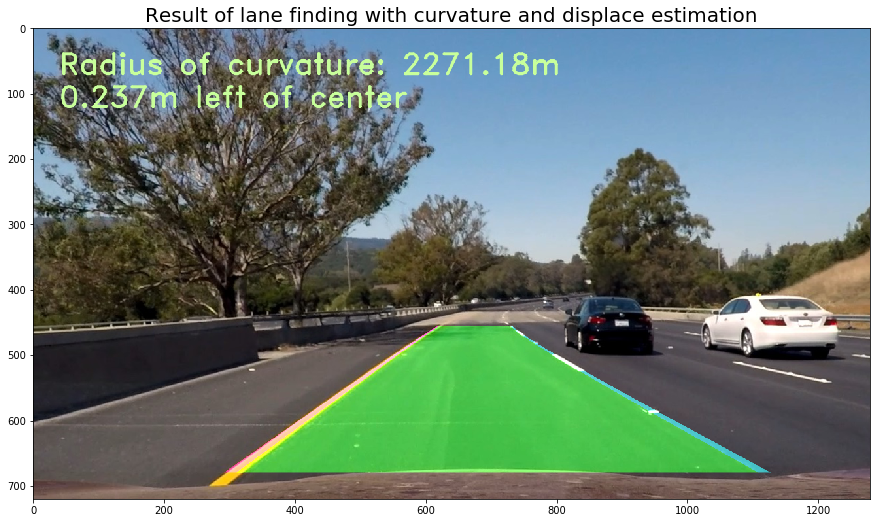

In [29]:
def write_on_Image(original_img, left_curve,right_curve,center_dist):
    test_img = np.copy(original_img)
    font = cv2.FONT_HERSHEY_DUPLEX
    rds_of_curve = (left_curve +right_curve)/2
    
    text = 'Radius of curvature: ' + '{:04.2f}'.format(rds_of_curve) + 'm'
    cv2.putText(test_img, text, (40,70), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    if center_dist > 0:
        direction = 'right'
    else:
        direction = 'left'
    text = '{:04.3f}'.format(abs(center_dist)) + 'm '+ direction + ' of center'
    cv2.putText(test_img, text, (40,120), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    return test_img


final = write_on_Image(result, left_curve, right_curve, center_dis)
plt.figure(figsize=(15,10))
plt.imshow(final)
plt.title('Result of lane finding with curvature and displace estimation', fontsize=20)

## put them into one function and try on all test img

In [30]:
def get_curve_info(image_path):
    color_combined, undis_img, M_inv= pipelines(image_path)
    
    binary_warped=np.copy(color_combined)
    out_img, left_fit, right_fit, left_fitx, right_fitx = fit_polynomial2(binary_warped)
    result = project_lane_line(binary_warped,left_fit, right_fit, M_inv, undis_img)

    center_curve,left_curve, right_curve, center_dis = measure_curvature(result ,left_fitx, right_fitx)
    
    output_image = write_on_Image(result, left_curve, right_curve, center_dis)
    return output_image

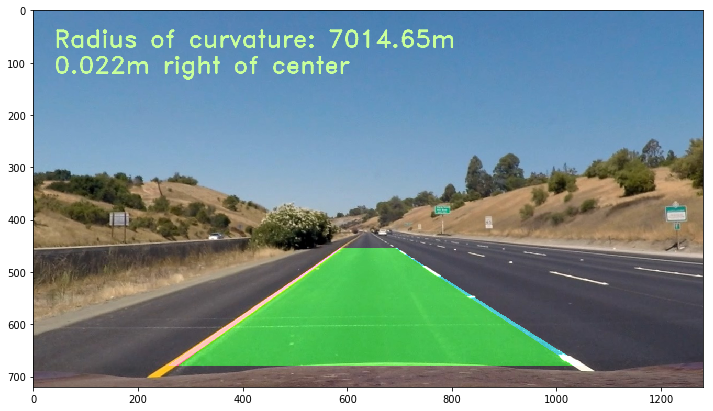

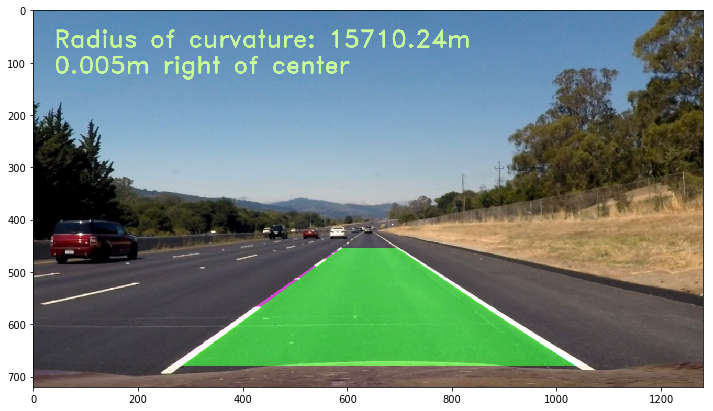

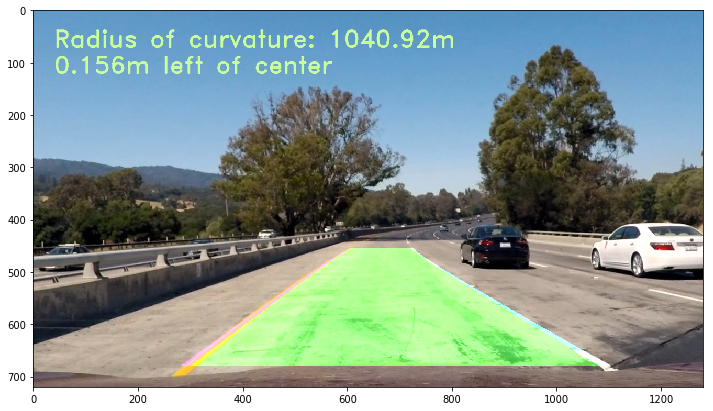

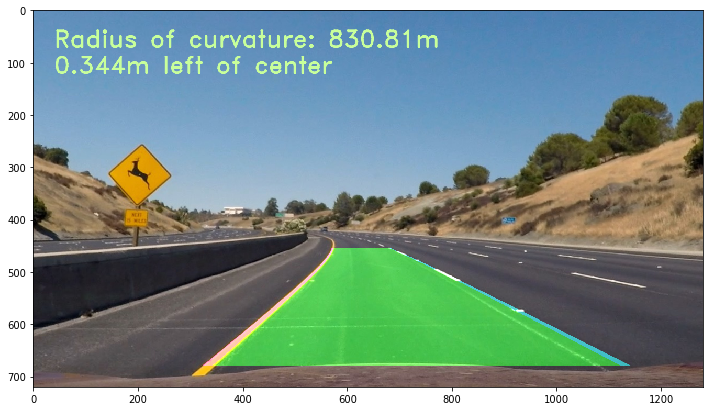

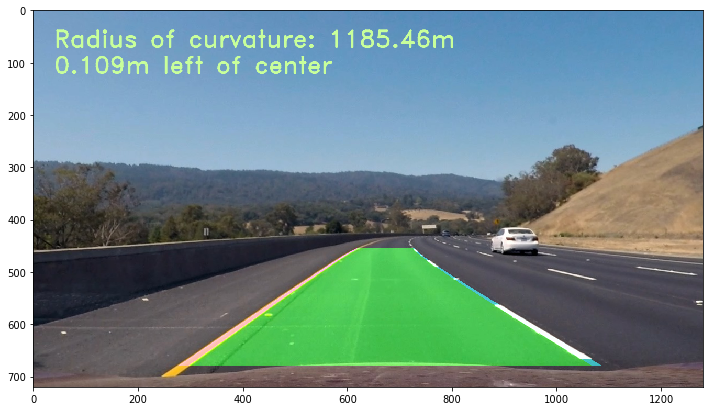

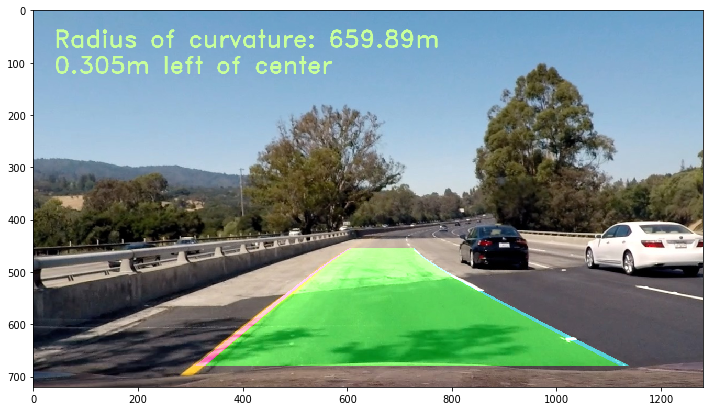

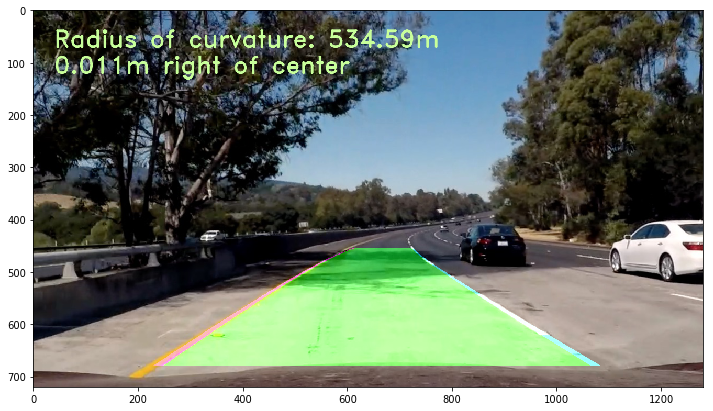

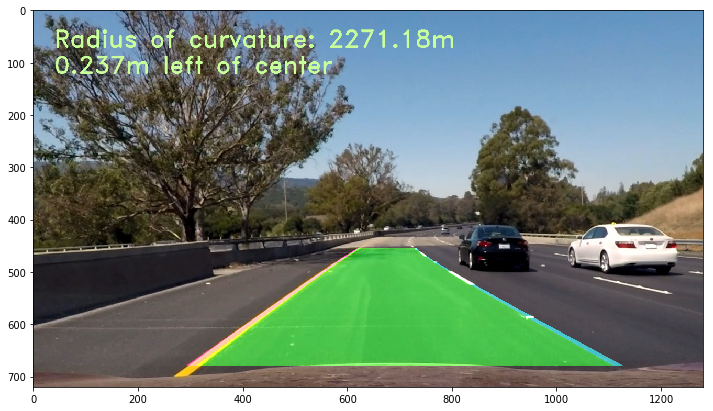

In [31]:
nu=1
for i in images:
    output_image=get_curve_info(i)
    plt.figure(nu)    
    plt.imshow(output_image)
    nu+=1

## Apply into video

In [32]:
def process_video2(img):

    undis_img = cv2.undistort(img, mtx, dist, None, mtx)
    warped_img, M_inv = warp(undis_img)
    color_combined=combine_threshold(warped_img)
    binary_warped=np.copy(color_combined)
    out_img, left_fit, right_fit, left_fitx, right_fitx = fit_polynomial2(binary_warped)
    result = project_lane_line(binary_warped,left_fit, right_fit, M_inv, undis_img)

    center_curve,left_curve, right_curve, center_dis = measure_curvature(result ,left_fitx, right_fitx)
    
    output_image = write_on_Image(result, left_curve, right_curve, center_dis)
    return output_image

In [33]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

output = 'project_video_out.mp4'


clip1 = VideoFileClip("project_video.mp4")
new_clip = clip1.fl_image(process_video2)


%time new_clip.write_videofile(output, audio=False)

Moviepy - Building video project_video_out.mp4.
Moviepy - Writing video project_video_out.mp4



Moviepy - Done !
Moviepy - video ready project_video_out.mp4
Wall time: 4min 39s


In [34]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))